# Análisis de Archivos de Audio

In [1]:
# Importamos las librerias
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.io import wavfile
from IPython.display import display, Audio, Markdown

In [2]:
# Helper Functions de la primera parte
def obtener_tamano_archivo(nombre_archivo: str) -> int:
    """
    Retorna el tamaño (en bytes) de un archivo dado su nombre.

    Parametros:
    - nombre_archivo: Ruta al archivo.

    Retorna:
    - Tamaño en bytes.
    """
    return os.path.getsize(nombre_archivo)

def obtener_probabilidades_simbolos(audio: np.ndarray) -> np.ndarray:
    """
    Calcula la distribución de probabilidad de los símbolos presentes en un array de audio.

    Parametros:
    - audio: Array numpy con muestras de audio (tipicamente int16 o float32 normalizado).

    Retorna:
    - Array de probabilidades para cada símbolo único.
    """
    simbolos, cuentas = np.unique(audio, return_counts=True)
    return cuentas / cuentas.sum()

def calcular_entropia_audio(audio: np.ndarray) -> float:
    """
    Calcula la entropía de una señal de audio usando la fórmula de Shannon.

    Parametros:
    - audio: Array numpy con muestras de audio.

    Retorna:
    - Valor de entropía en bits por símbolo (float).
    """
    probabilidades = obtener_probabilidades_simbolos(audio)
    return -np.sum(probabilidades * np.log2(probabilidades))

def obtener_estadisticas_senal_y_diferencias(senal: np.ndarray) -> tuple:
    """
    Calcula estadísticas básicas de una señal de audio y sus diferencias sucesivas.

    Parámetros:
    - senal: Array numpy 1D de audio.

    Retorna:
    - Tuple con:
        - Varianza de la señal
        - Desviación estándar de la señal
        - Rango de la señal
        - Varianza de las diferencias
        - Desviación estándar de las diferencias
        - Rango de las diferencias
    """
    senal = senal.astype(np.int32)
    diferencias = np.diff(senal)

    var_senal = np.var(senal)
    std_senal = np.std(senal)
    rango_senal = np.max(senal) - np.min(senal)

    var_dif = np.var(diferencias)
    std_dif = np.std(diferencias)
    rango_dif = np.max(diferencias) - np.min(diferencias)

    return (var_senal, std_senal, rango_senal, var_dif, std_dif, rango_dif)


def graficar_onda(senal: np.ndarray, tasa_muestreo: int) -> None:
    """
    Grafica la forma de onda de una señal de audio (mono o estéreo).

    Parametros:
    - senal: Array numpy con las muestras de audio.
    - tasa_muestreo: Frecuencia de muestreo en Hz.
    """
    duracion = senal.shape[0] / tasa_muestreo
    tiempo = np.linspace(0., duracion, senal.shape[0])

    plt.figure(figsize=(12, 4))

    if senal.ndim == 1:
        plt.plot(tiempo, senal, label="Mono", color="black")
    elif senal.ndim == 2:
        plt.plot(tiempo, senal[:, 0], label="Canal Izquierdo", color="lightblue")
        plt.plot(tiempo, senal[:, 1], label="Canal Derecho", color="orange")
    else:
        raise ValueError("Formato de audio no reconocido (ni mono ni estereo)")

    plt.title("Forma de onda original")
    plt.xlabel("Tiempo [s]")
    plt.ylabel("Amplitud")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [3]:
# Constantes
ARCHIVOS_AUDIO = ("GolpeoPingPong.wav", "PreparacionOrquesta.wav", "Semaforo1.wav", "Vitamina.wav")

## Análisis previo

### Archivo: 'GolpeoPingPong.wav'

	- Tamaño del archivo en bytes: 435608
	- Sample Rate en bytes: 44100
	- La entropía es de 5.4425 bits/simbolo
	- La entropía de las diferencias es de 4.6789 bits/simbolo
	- Varianza original: 320938.31
	- Desvío estándar original: 566.51
	- Rango original: 64990.00
	- Varianza de diferencias: 7753.93
	- Desvío de diferencias: 88.06
	- Rango de las diferencias: 64990.00


/var/folders/7c/d4cy41f91qv_48wzcnr_fd340000gn/T/ipykernel_61337/4101081097.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, data_orig = wavfile.read(audio)


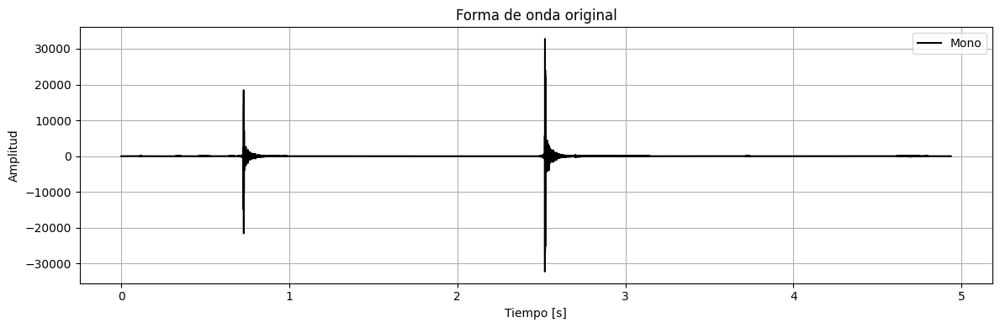

### Archivo: 'PreparacionOrquesta.wav'

	- Tamaño del archivo en bytes: 1766940
	- Sample Rate en bytes: 44100
	- La entropía es de 14.6286 bits/simbolo
	- La entropía de las diferencias es de 4.6789 bits/simbolo
	- Varianza original: 320938.31
	- Desvío estándar original: 566.51
	- Rango original: 64990.00
	- Varianza de diferencias: 7753.93
	- Desvío de diferencias: 88.06
	- Rango de las diferencias: 64990.00


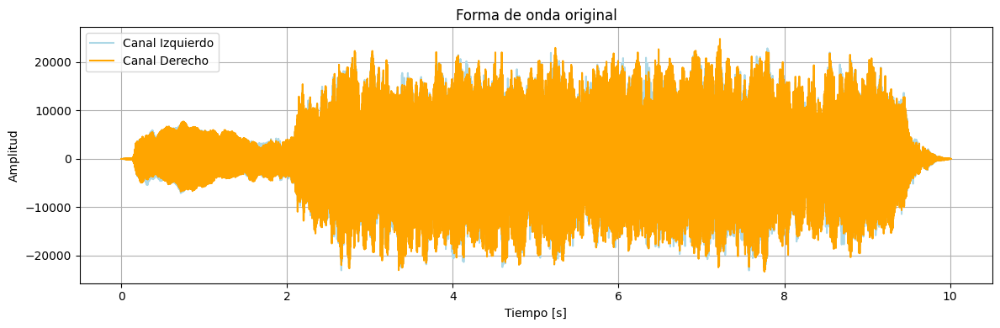

### Archivo: 'Semaforo1.wav'

	- Tamaño del archivo en bytes: 88280
	- Sample Rate en bytes: 44100
	- La entropía es de 12.2649 bits/simbolo
	- La entropía de las diferencias es de 11.3684 bits/simbolo
	- Varianza original: 35237552.64
	- Desvío estándar original: 5936.12
	- Rango original: 40084.00
	- Varianza de diferencias: 9526787.62
	- Desvío de diferencias: 3086.55
	- Rango de las diferencias: 40084.00


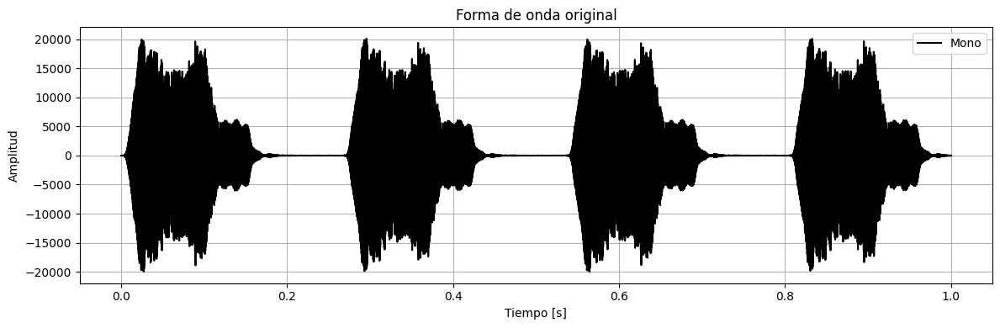

### Archivo: 'Vitamina.wav'

	- Tamaño del archivo en bytes: 170032
	- Sample Rate en bytes: 44100
	- La entropía es de 10.9227 bits/simbolo
	- La entropía de las diferencias es de 11.3684 bits/simbolo
	- Varianza original: 35237552.64
	- Desvío estándar original: 5936.12
	- Rango original: 40084.00
	- Varianza de diferencias: 9526787.62
	- Desvío de diferencias: 3086.55
	- Rango de las diferencias: 40084.00


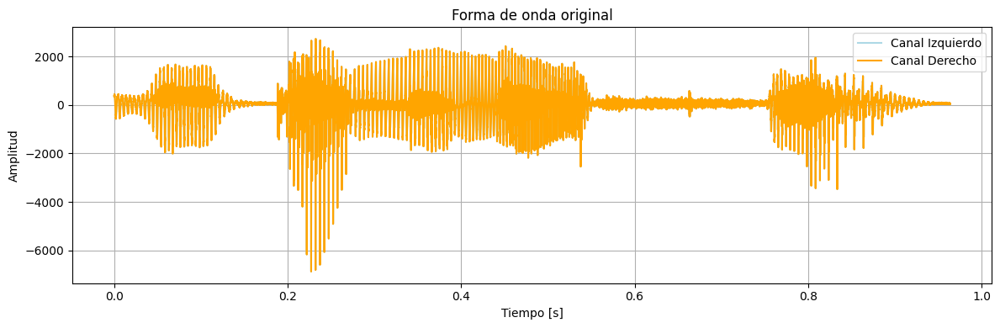

In [4]:
for audio in ARCHIVOS_AUDIO:
    display(Markdown(f"### Archivo: '{audio}'"))
    # Tamaño de cada archivo
    print(f"\t- Tamaño del archivo en bytes: {obtener_tamano_archivo(audio)}")
    
    # Tomamos el samplerate y data del archivo
    samplerate, data_orig = wavfile.read(audio)
    print(f"\t- Sample Rate en bytes: {samplerate}")
    
    # Cálculo de entropía
    entropy = calcular_entropia_audio(data_orig)
    print(f"\t- La entropía es de {entropy:.4f} bits/simbolo")

    # Cálculo de la entropía de las diferencias entre muestras sucesivas
    # Flatten si es stereo (N, 2)
    if data_orig.ndim > 1:
        data = data.flatten()
    else:
        data = data_orig
    diff_entropy = calcular_entropia_audio(np.diff(data, axis=0))
    print(f"\t- La entropía de las diferencias es de {diff_entropy:.4f} bits/simbolo")

    var_senal, std_senal, rango_senal, var_dif, std_dif, rango_dif = obtener_estadisticas_senal_y_diferencias(data)
    print(f"\t- Varianza original: {var_senal:.2f}")
    print(f"\t- Desvío estándar original: {std_senal:.2f}")
    print(f"\t- Rango original: {rango_senal:.2f}")
    print(f"\t- Varianza de diferencias: {var_dif:.2f}")
    print(f"\t- Desvío de diferencias: {std_dif:.2f}")
    print(f"\t- Rango de las diferencias: {rango_senal:.2f}")

    graficar_onda(data_orig, samplerate)

## Aplicación del Codificador y Decodificador Diferencial

In [5]:
# Helper functions de la segunda parte
def codificador_diferencial_con_cuantizacion(senal: np.ndarray, niveles: int) -> tuple[np.ndarray, np.ndarray]:
    """
    Aplica codificación diferencial con cuantización uniforme a una señal.

    Parámetros:
    - senal: array 1D de audio normalizado
    - niveles: cantidad de niveles del cuantizador

    Retorna:
    - Señal reconstruida (array)
    - Diferencias cuantizadas (array)
    """
    diferencia = np.zeros_like(senal)
    diferencias_cuantizadas = np.zeros_like(senal)
    senal_reconstruida = np.zeros_like(senal)

    # Se calcula el rango de las diferencias en lugar de la señal completa
    diferencias_previas = np.diff(senal, prepend=0)
    rango = np.max(np.abs(diferencias_previas)) * 2
    delta = rango / niveles

    # Primer valor especial
    diferencia[0] = senal[0]
    diferencias_cuantizadas[0] = np.round(diferencia[0] / delta) * delta
    senal_reconstruida[0] = diferencias_cuantizadas[0]

    for i in range(1, len(senal)):
        diferencia[i] = senal[i] - senal_reconstruida[i - 1]
        diferencias_cuantizadas[i] = np.round(diferencia[i] / delta) * delta
        senal_reconstruida[i] = diferencias_cuantizadas[i] + senal_reconstruida[i - 1]

    return senal_reconstruida, diferencias_cuantizadas


def calcular_metricas(senal_original: np.ndarray, senal_reconstruida: np.ndarray) -> tuple[float, float]:
    """
    Calcula la distorsión y la relación señal-ruido (SNR) entre señales.
    
    Parámetros:
    - senal_original: señal original (array)
    - senal_reconstruida: señal luego de cuantización (array)
    
    Retorna:
    - SNR (float)
    - Distorsión (float)
    """
    error = senal_original - senal_reconstruida
    distorsion = np.mean(error ** 2)
    snr = 10 * np.log10(np.sum(senal_original ** 2) / np.sum(error ** 2))
    return snr, distorsion

def graficar_senales(tiempo: np.ndarray, original: np.ndarray, reconstruida: np.ndarray,
                     niveles: int, snr: float, distorsion: float) -> None:
    """
    Grafica la señal original y la reconstruida.
    
    Parámetros:
    - tiempo: vector de tiempo en segundos
    - original: señal original (array)
    - reconstruida: señal reconstruida (array)
    - niveles: cantidad de niveles del cuantizador
    - snr: relación señal-ruido en dB
    - distorsion: error cuadrático medio
    """
    plt.figure(figsize=(12, 4))
    plt.plot(tiempo, original, label="Original", color="red", linewidth=1)
    plt.plot(tiempo, reconstruida, label="Reconstruida", color="lightblue", linestyle='--', linewidth=1)
    plt.title(f"Reconstrucción con {niveles} niveles | SNR = {snr:.2f} dB | Distorsión = {distorsion:.4f}")
    plt.xlabel("Tiempo [s]")
    plt.ylabel("Amplitud")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Archivo: 'GolpeoPingPong.wav'

/var/folders/7c/d4cy41f91qv_48wzcnr_fd340000gn/T/ipykernel_61337/620381606.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, data = wavfile.read(audio)


Intervalo 'N': 2
SNR: 10.20 dB
Distorsión: 0.0000


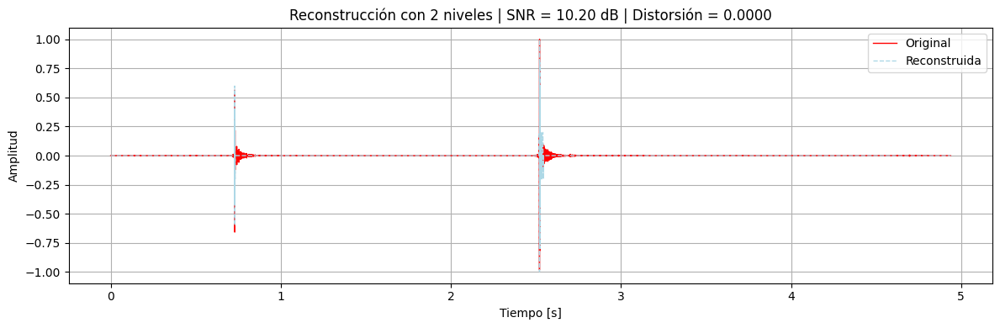

**Reproducción del audio reconstruido:**

Intervalo 'N': 4
SNR: 12.95 dB
Distorsión: 0.0000


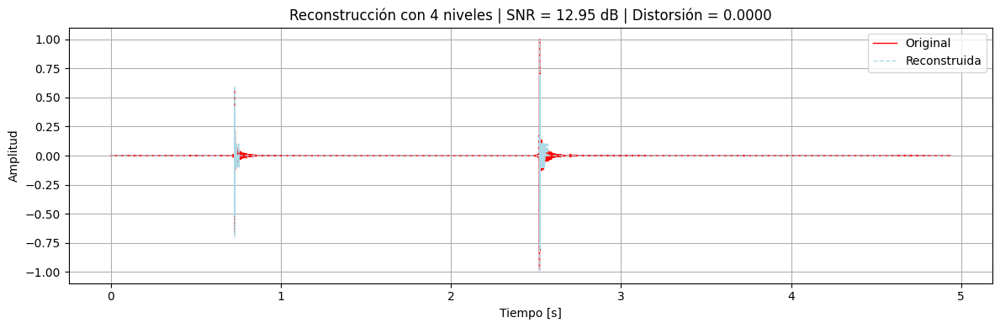

**Reproducción del audio reconstruido:**

Intervalo 'N': 8
SNR: 16.82 dB
Distorsión: 0.0000


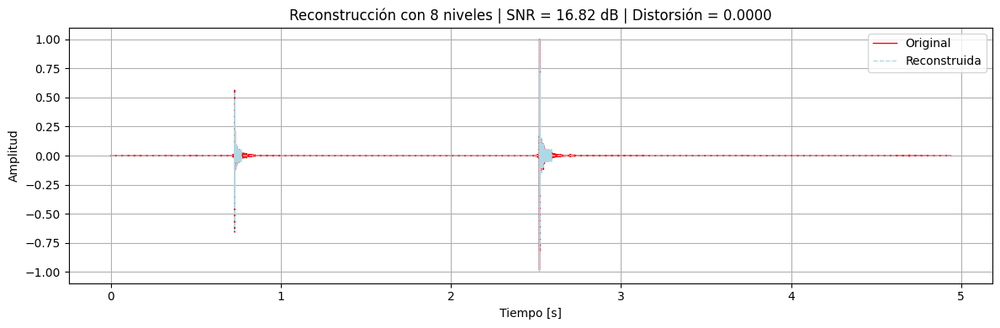

**Reproducción del audio reconstruido:**

Intervalo 'N': 16
SNR: 21.28 dB
Distorsión: 0.0000


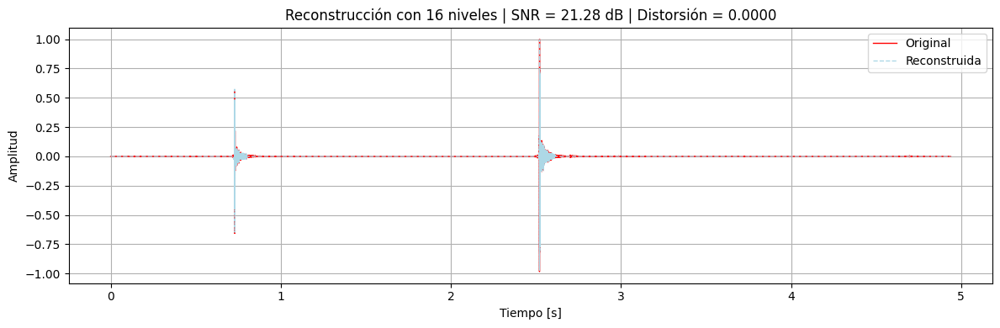

**Reproducción del audio reconstruido:**

Intervalo 'N': 32
SNR: 25.41 dB
Distorsión: 0.0000


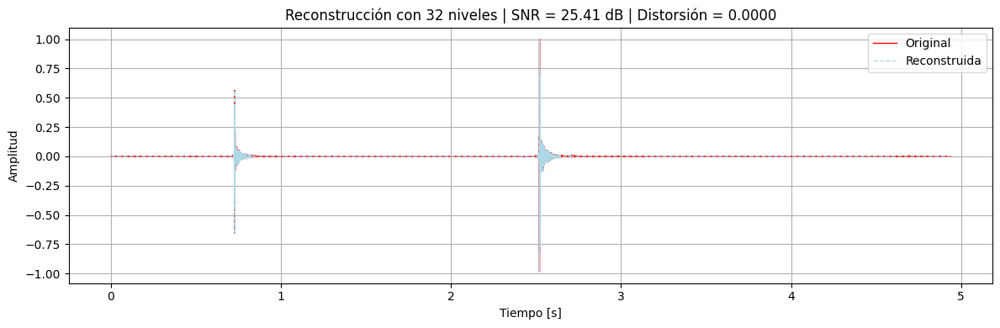

**Reproducción del audio reconstruido:**

Intervalo 'N': 64
SNR: 28.96 dB
Distorsión: 0.0000


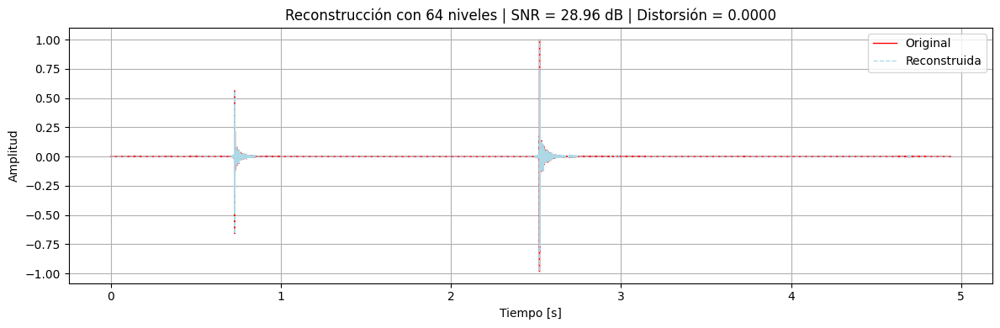

**Reproducción del audio reconstruido:**

Intervalo 'N': 128
SNR: 32.80 dB
Distorsión: 0.0000


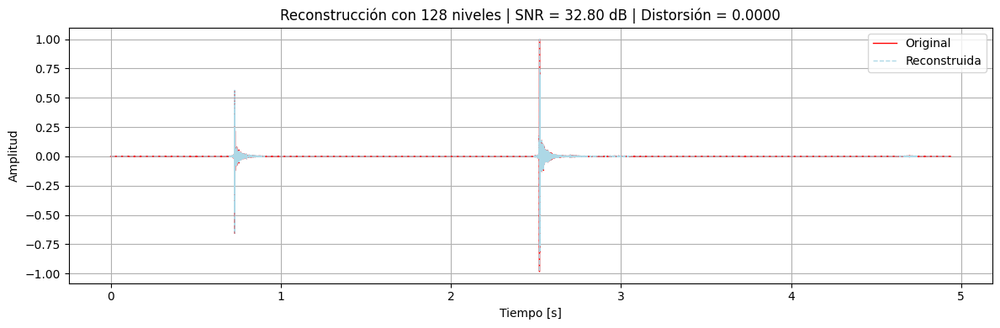

**Reproducción del audio reconstruido:**

Intervalo 'N': 256
SNR: 36.94 dB
Distorsión: 0.0000


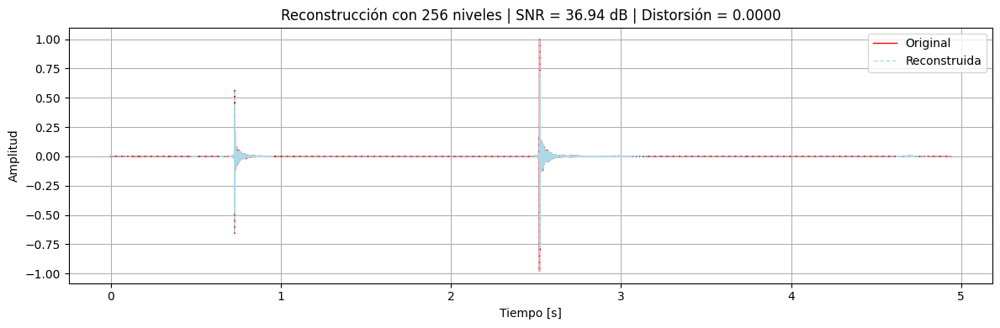

**Reproducción del audio reconstruido:**

### Archivo: 'PreparacionOrquesta.wav'

Intervalo 'N': 2
SNR: 16.71 dB
Distorsión: 0.0017


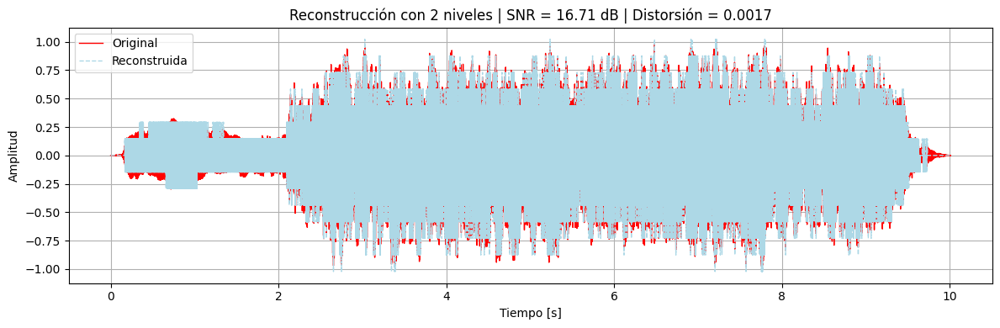

**Reproducción del audio reconstruido:**

Intervalo 'N': 4
SNR: 22.73 dB
Distorsión: 0.0004


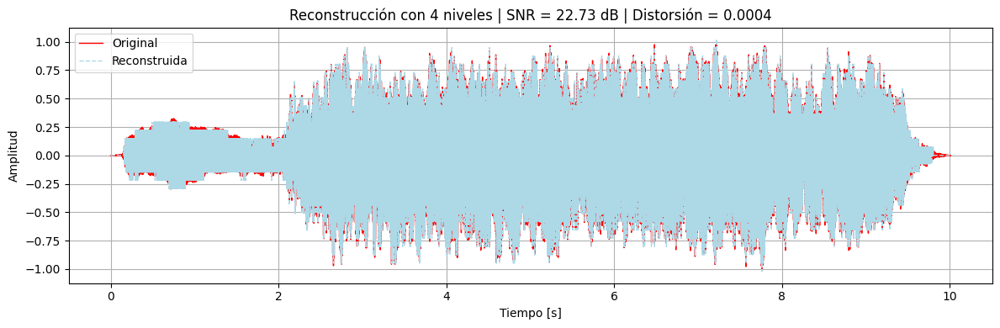

**Reproducción del audio reconstruido:**

Intervalo 'N': 8
SNR: 28.75 dB
Distorsión: 0.0001


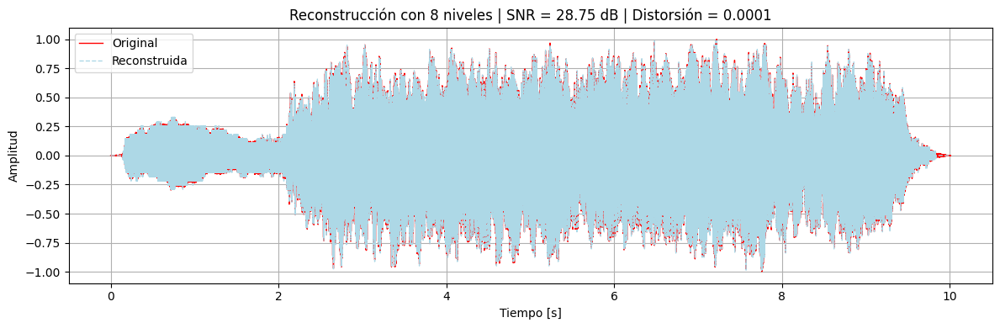

**Reproducción del audio reconstruido:**

Intervalo 'N': 16
SNR: 34.73 dB
Distorsión: 0.0000


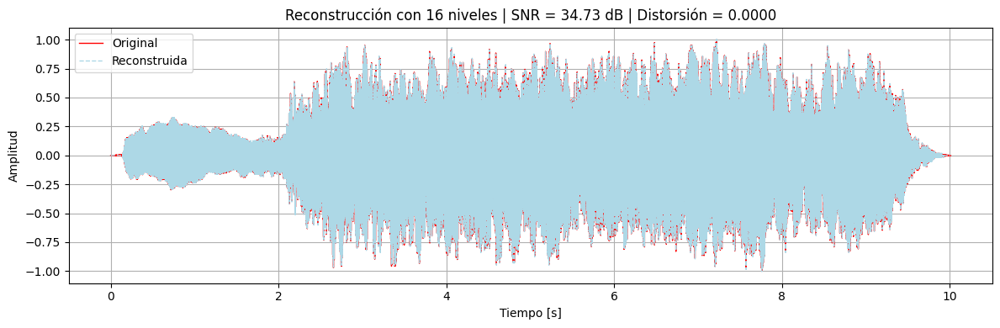

**Reproducción del audio reconstruido:**

Intervalo 'N': 32
SNR: 40.71 dB
Distorsión: 0.0000


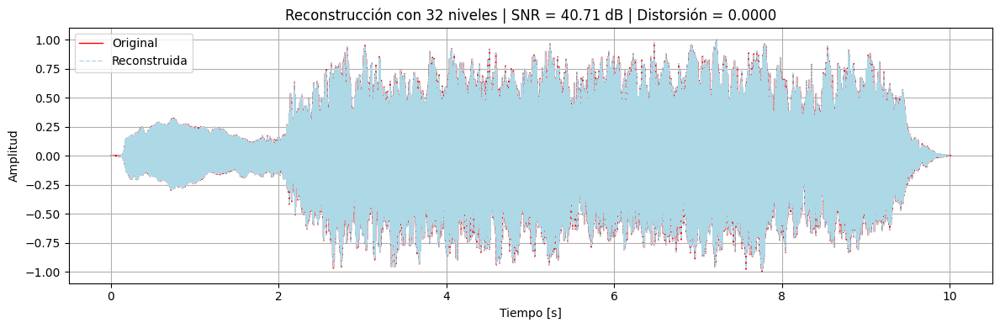

**Reproducción del audio reconstruido:**

Intervalo 'N': 64
SNR: 46.72 dB
Distorsión: 0.0000


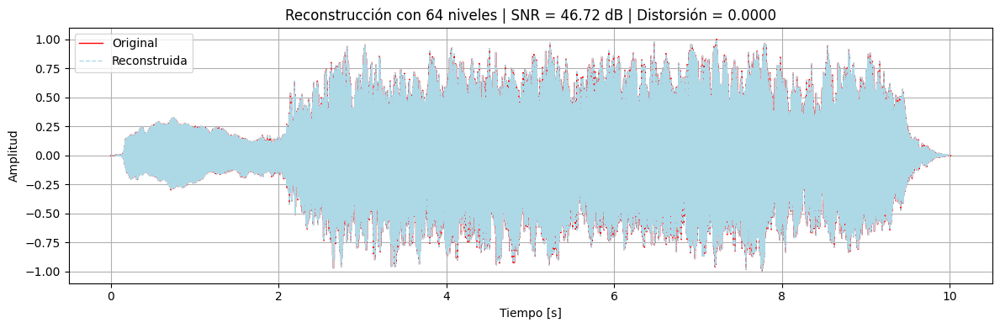

**Reproducción del audio reconstruido:**

Intervalo 'N': 128
SNR: 52.73 dB
Distorsión: 0.0000


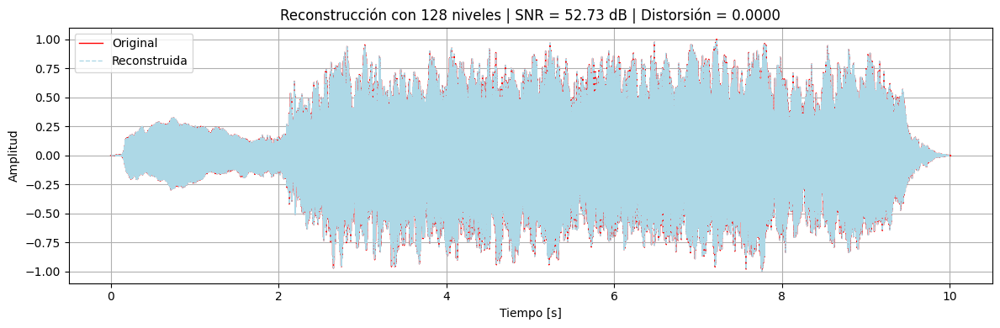

**Reproducción del audio reconstruido:**

Intervalo 'N': 256
SNR: 58.73 dB
Distorsión: 0.0000


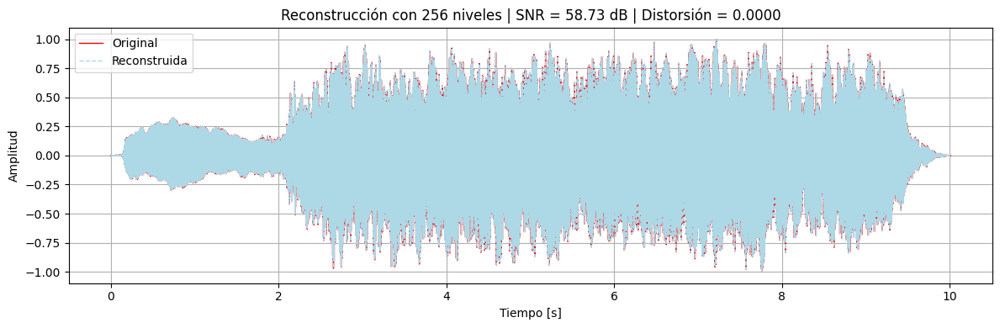

**Reproducción del audio reconstruido:**

### Archivo: 'Semaforo1.wav'

Intervalo 'N': 2
SNR: 6.56 dB
Distorsión: 0.0192


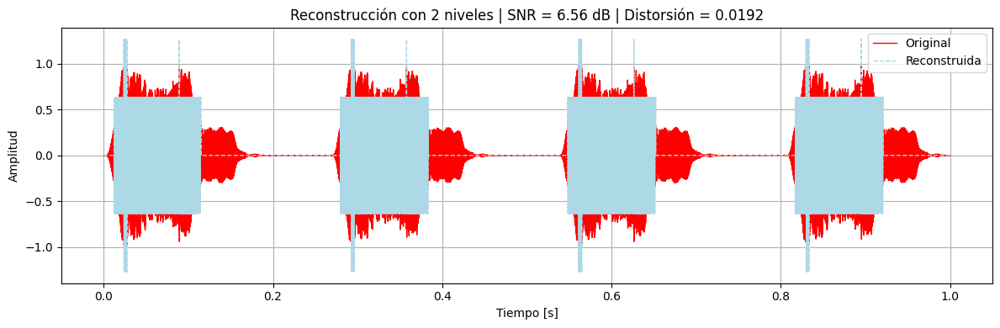

**Reproducción del audio reconstruido:**

Intervalo 'N': 4
SNR: 12.15 dB
Distorsión: 0.0053


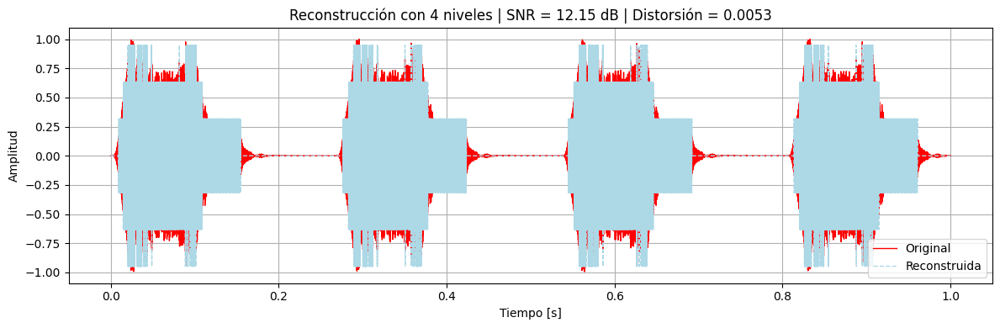

**Reproducción del audio reconstruido:**

Intervalo 'N': 8
SNR: 17.98 dB
Distorsión: 0.0014


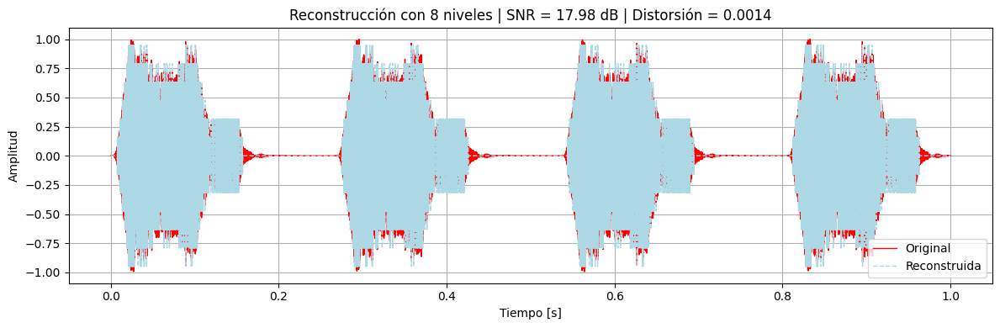

**Reproducción del audio reconstruido:**

Intervalo 'N': 16
SNR: 24.06 dB
Distorsión: 0.0003


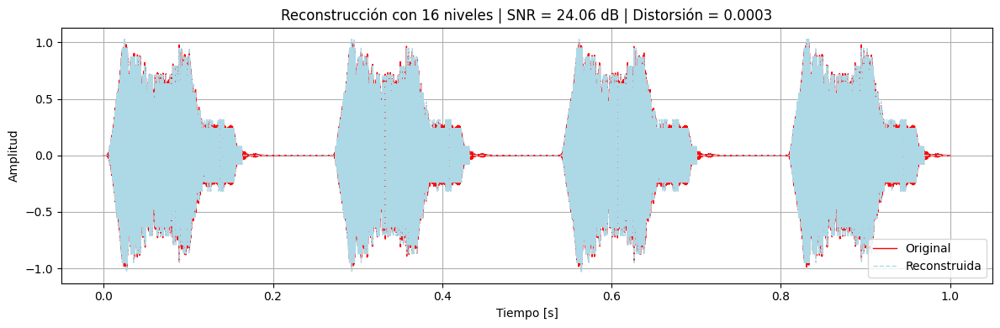

**Reproducción del audio reconstruido:**

Intervalo 'N': 32
SNR: 29.95 dB
Distorsión: 0.0001


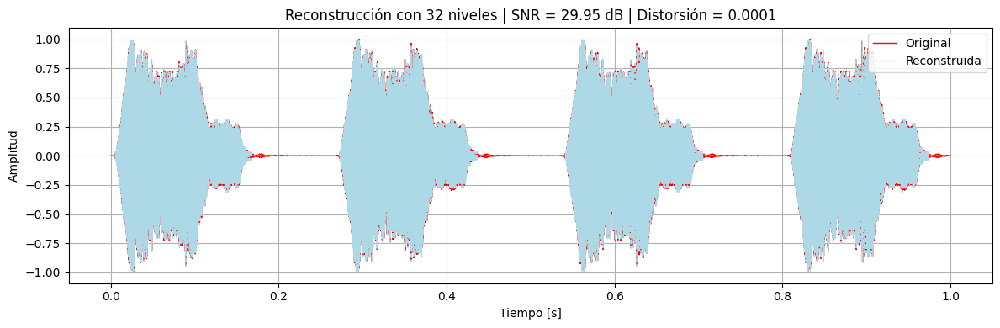

**Reproducción del audio reconstruido:**

Intervalo 'N': 64
SNR: 35.74 dB
Distorsión: 0.0000


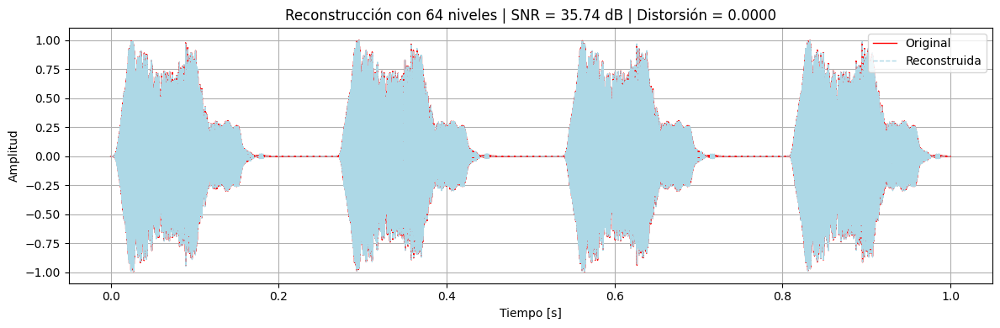

**Reproducción del audio reconstruido:**

Intervalo 'N': 128
SNR: 41.58 dB
Distorsión: 0.0000


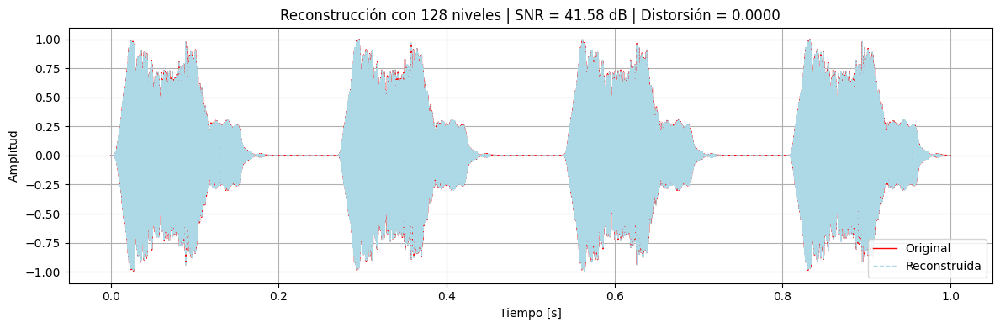

**Reproducción del audio reconstruido:**

Intervalo 'N': 256
SNR: 47.33 dB
Distorsión: 0.0000


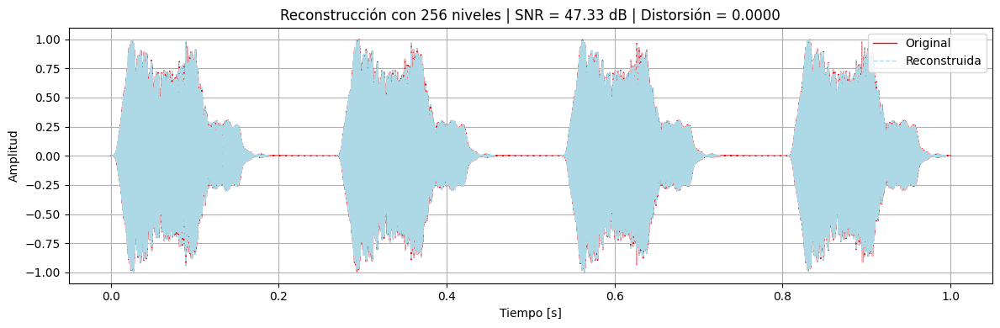

**Reproducción del audio reconstruido:**

### Archivo: 'Vitamina.wav'

Intervalo 'N': 2
SNR: 6.29 dB
Distorsión: 0.0024


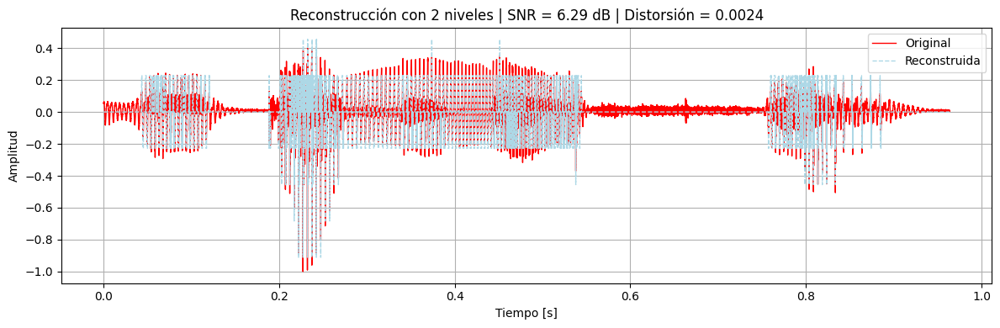

**Reproducción del audio reconstruido:**

Intervalo 'N': 4
SNR: 11.06 dB
Distorsión: 0.0008


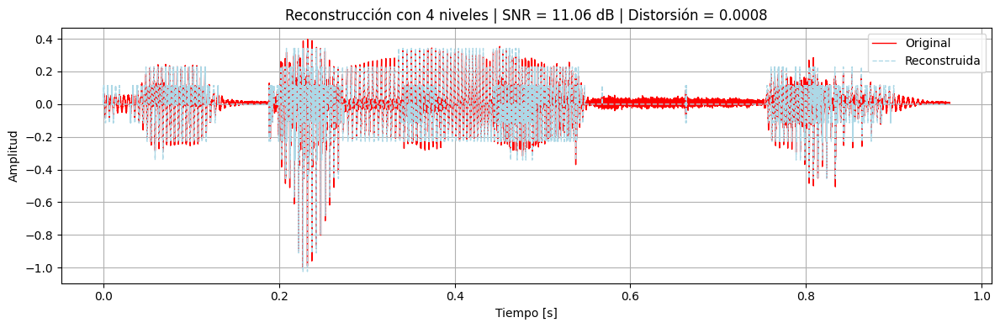

**Reproducción del audio reconstruido:**

Intervalo 'N': 8
SNR: 16.34 dB
Distorsión: 0.0002


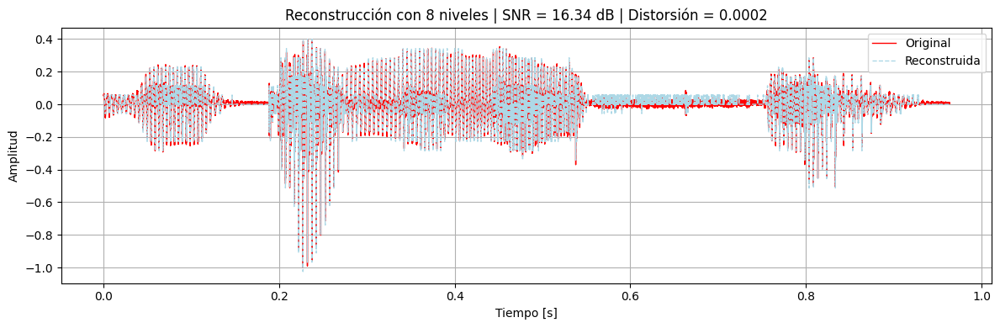

**Reproducción del audio reconstruido:**

Intervalo 'N': 16
SNR: 21.69 dB
Distorsión: 0.0001


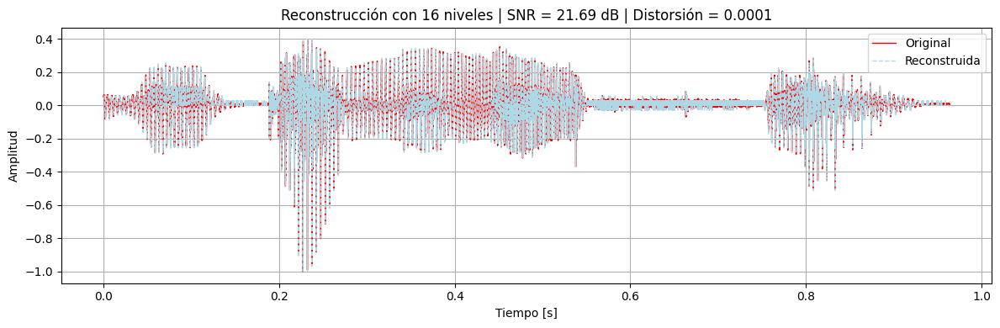

**Reproducción del audio reconstruido:**

Intervalo 'N': 32
SNR: 27.72 dB
Distorsión: 0.0000


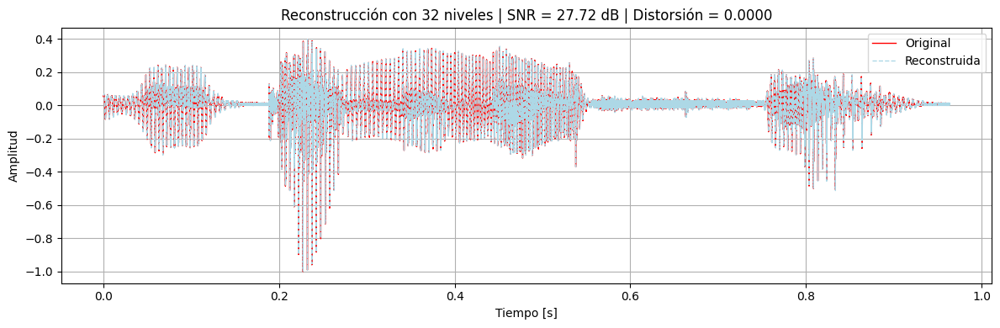

**Reproducción del audio reconstruido:**

Intervalo 'N': 64
SNR: 33.84 dB
Distorsión: 0.0000


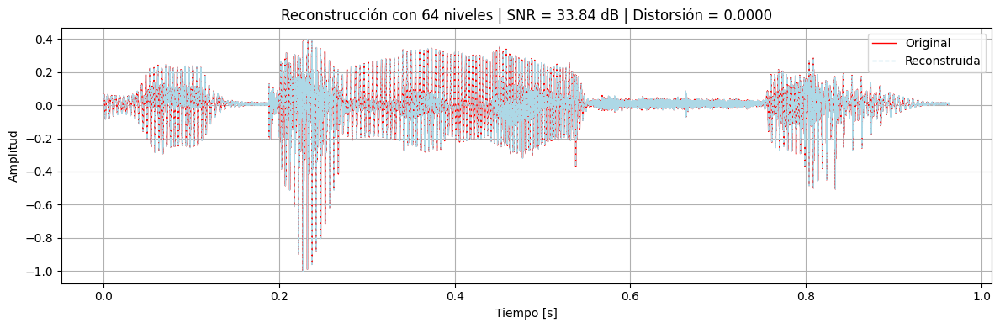

**Reproducción del audio reconstruido:**

Intervalo 'N': 128
SNR: 39.85 dB
Distorsión: 0.0000


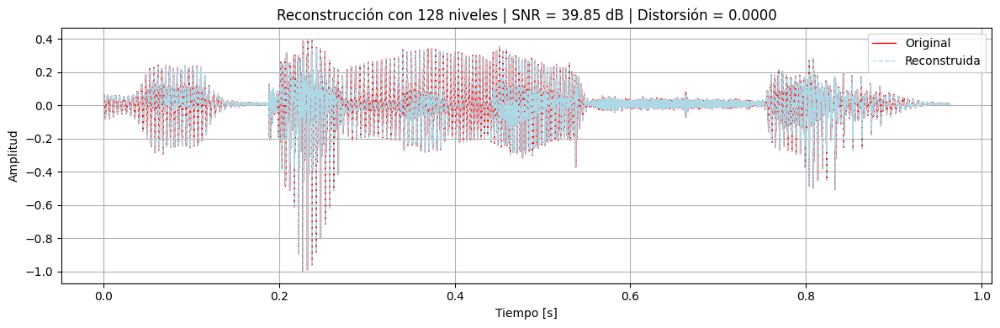

**Reproducción del audio reconstruido:**

Intervalo 'N': 256
SNR: 45.93 dB
Distorsión: 0.0000


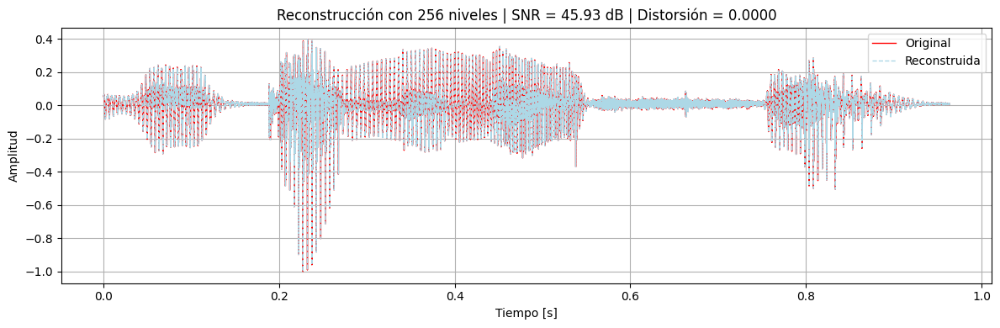

**Reproducción del audio reconstruido:**

In [6]:
intervalos_N = [2, 4, 8, 16, 32, 64, 128, 256]

for audio in ARCHIVOS_AUDIO:
    display(Markdown(f"### Archivo: '{audio}'"))

    # Leer el archivo
    samplerate, data = wavfile.read(audio)

    # Convertir a mono si es estéreo
    if data.ndim == 2:
        data = data.mean(axis=1)

    # Normalizamos
    x = data.astype(np.float32)
    x = x / np.max(np.abs(x))

    # Vector de tiempo
    t = np.arange(len(x)) / samplerate
  
    for N in intervalos_N:
        xq, dq = codificador_diferencial_con_cuantizacion(x, N)
        snr, distorsion = calcular_metricas(x, xq)

        print(f"Intervalo 'N': {N}")
        print(f"SNR: {snr:.2f} dB")
        print(f"Distorsión: {distorsion:.4f}")
        graficar_senales(t, x, xq, N, snr, distorsion)

        display(Markdown("**Reproducción del audio reconstruido:**"))
        display(Audio(xq, rate=samplerate))